In [1]:
import pathlib
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import img_to_array, load_img

## Loading Images

In [2]:
# Defining the path for T1 & T2 datasets
t1_dir = "MRI T1 T2 Dataset/Tr1/TrainT1/"
t2_dir = "MRI T1 T2 Dataset/Tr2/TrainT2/"

In [3]:
t1_images = sorted(os.listdir(t1_dir), key=lambda x: int(x.split('#')[1].split('.')[0]))
t2_images = sorted(os.listdir(t2_dir), key=lambda x: int(x.split('#')[1].split('.')[0]))

In [4]:
# Removing problematic images
t2_images.remove('Image #80.png')
t2_images.remove('Image #81.png')
t2_images.remove('Image #82.png')

In [5]:
t1_images = [os.path.join(t1_dir, image) for image in t1_images]
t2_images = [os.path.join(t2_dir, image) for image in t2_images]

In [6]:
images = []

for t1_image, t2_image in zip(t1_images, t2_images):
    images.append([[tf.io.decode_png(tf.io.read_file(t1_image)), t1_image], [tf.io.decode_png(tf.io.read_file(t2_image)), t2_image]])

2023-06-12 06:53:00.805536: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Visualization

In [7]:
def show_images(images, index):
    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(images[index][0][0], cmap='gray')
    plt.title(images[index][0][1])
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(images[index][1][0], cmap='gray')
    plt.title(images[index][1][1])
    plt.axis('off')
    plt.show()

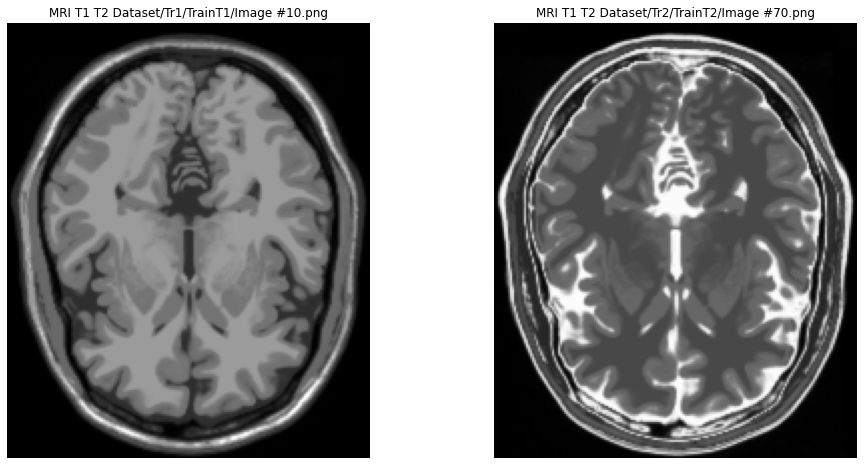

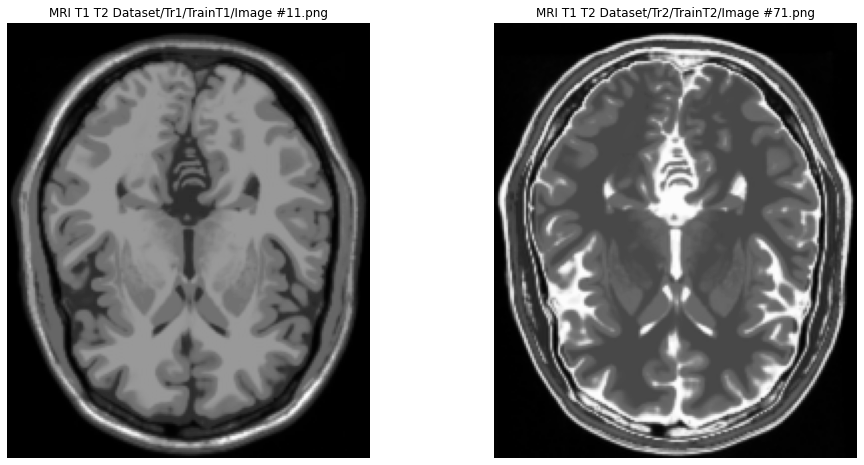

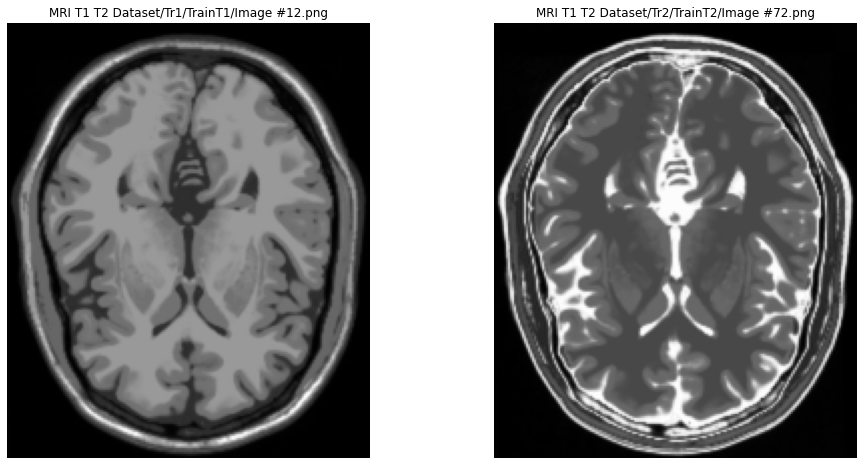

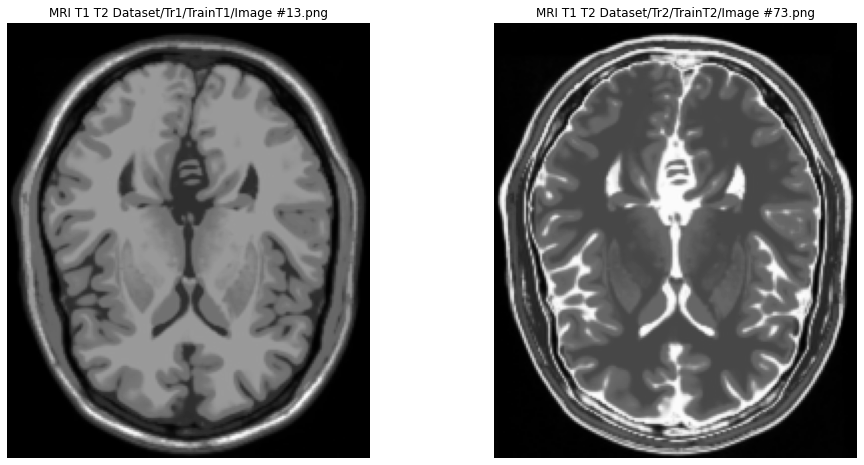

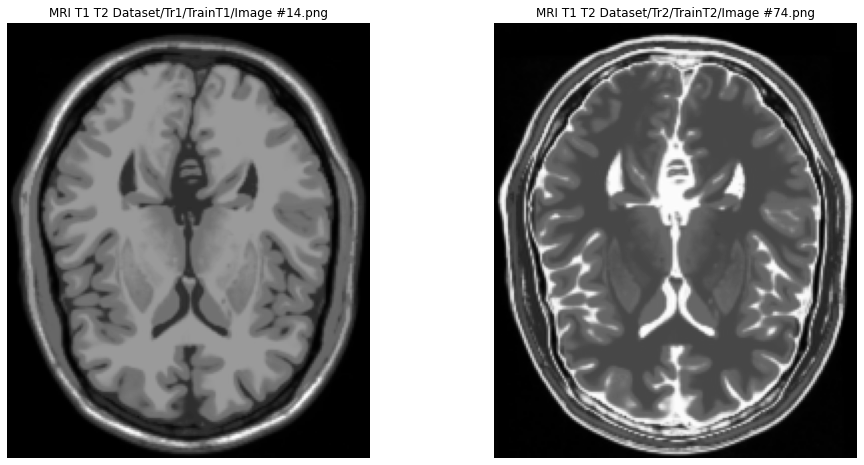

...

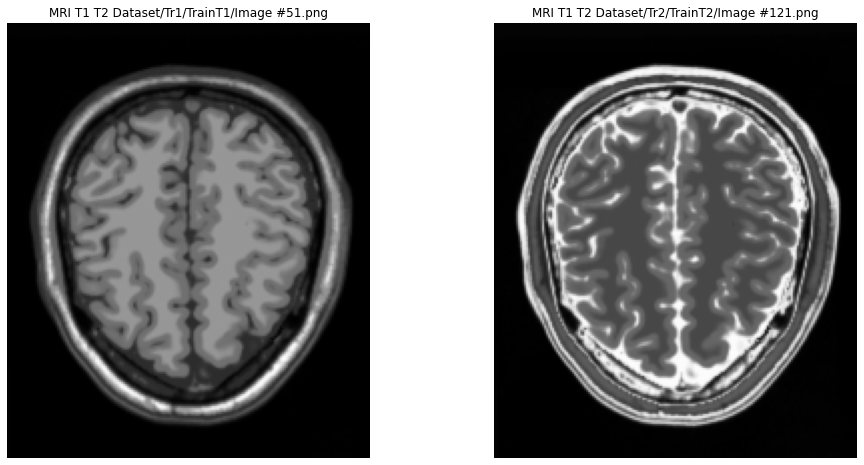

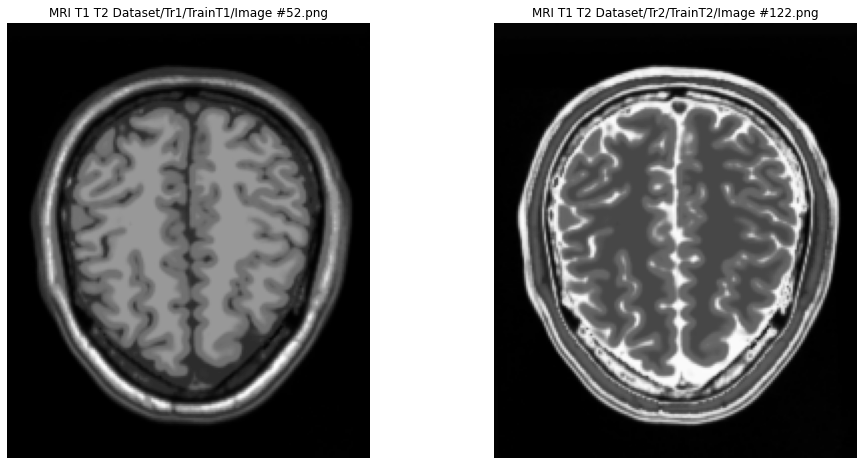

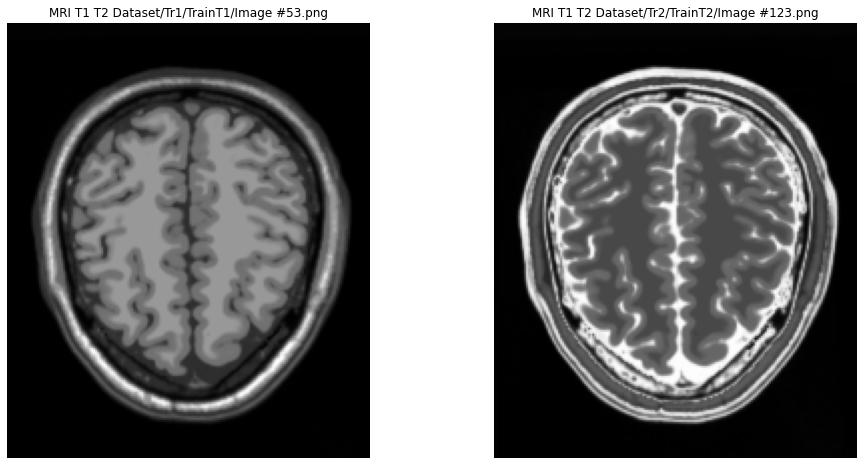

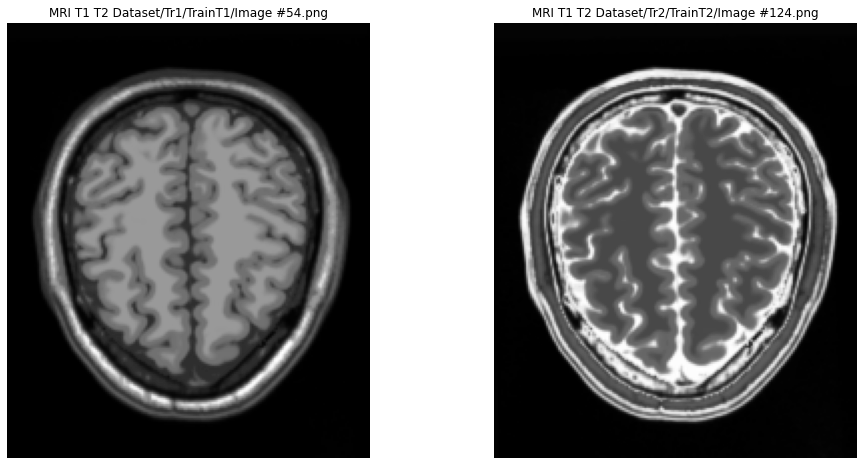

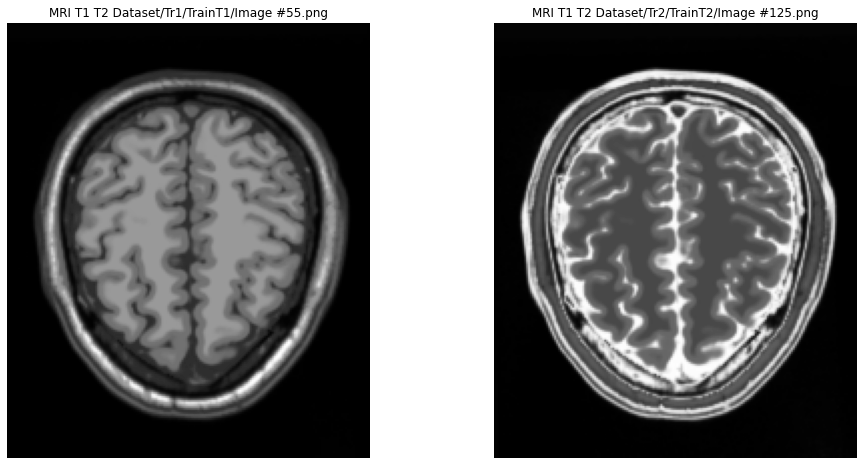

In [8]:
# use show_images function to show images
for i in range(43):
    show_images(images, i)

## Image Preprocessing

In [9]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1

In [10]:
# Convert to numpy array
tr1_data = np.asarray([img_to_array(load_img(image, target_size=(256,256))) for image in t1_images])
tr2_data = np.asarray([img_to_array(load_img(image, target_size=(256,256))) for image in t2_images])

In [11]:
# Convert to grayscale
tr1_data = tf.image.rgb_to_grayscale(tr1_data)
tr2_data = tf.image.rgb_to_grayscale(tr2_data)

In [12]:
# Convert to tensor
tr1= tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(tr1_data))
tr2= tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(tr2_data))

In [13]:
# normalizing the images to [-1, 1]
def normalize(image):
    image = tf.cast(image, tf.float32)
    image = tf.math.divide(image, 127.5)
    image = tf.math.subtract(image, 1.0)
    return image

In [14]:
def preprocess_image_train(image):
    image = tf.image.random_flip_left_right(image)
    image = normalize(image)   
    return image

In [15]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
tr1 = tr1.map(preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
tr2 = tr2.map(preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [16]:
sample_tr1 = next(iter(tr1))
sample_tr2 = next(iter(tr2))

2023-06-12 06:53:09.151955: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)


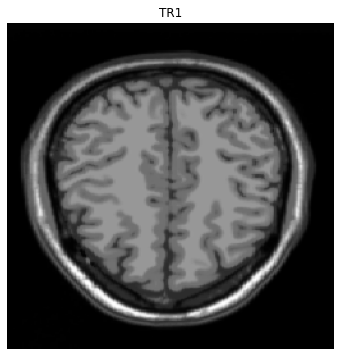

In [17]:
plt.figure(figsize=(12, 6))
plt.title('TR1')
plt.imshow(sample_tr1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
plt.axis('off')
plt.show()

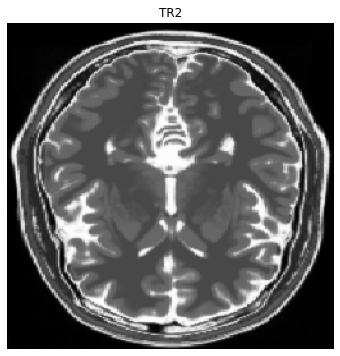

In [18]:
plt.figure(figsize=(12, 6))
plt.title('TR2')
plt.imshow(sample_tr2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
plt.axis('off')
plt.show()

## Model Building

In [19]:
# Helper functions
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(tf.math.add(variance, self.epsilon))
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)) # type: ignore
    if apply_norm:
        result.add(InstanceNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)) # type: ignore
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

### Generator

In [20]:
def unet_generator():
    # A stack of downsample models
    down_stack = [
      downsample(64, 4, apply_norm=False), 
      downsample(128, 4), 
      downsample(256, 4),  
      downsample(512, 4),  
      downsample(512, 4), 
      downsample(512, 4),  
      downsample(512, 4),  
      downsample(512, 4),  
    ]

    # A stack of upsample models
    up_stack = [
      upsample(512, 4, apply_dropout=True),  
      upsample(512, 4, apply_dropout=True),  
      upsample(512, 4, apply_dropout=True),  
      upsample(512, 4),  
      upsample(256, 4),  
      upsample(128, 4),  
      upsample(64, 4),  
    ]
        
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')  # type: ignore
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[None, None, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

In [21]:
# Initialise the generators
generator_g = unet_generator()
generator_f = unet_generator()

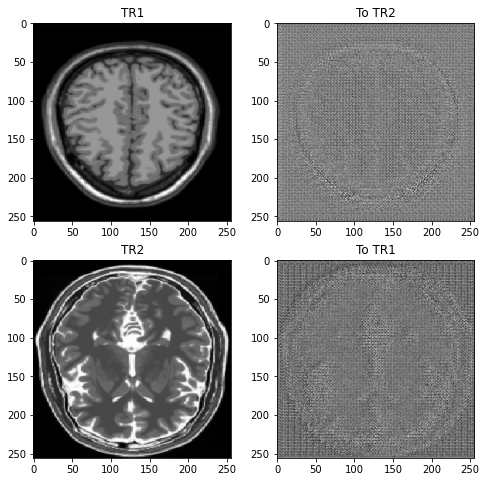

In [22]:
to_tr2 = generator_g(sample_tr1)
to_tr1 = generator_f(sample_tr2)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_tr1, to_tr2, sample_tr2, to_tr1]
title = ['TR1', 'To TR2', 'TR2', 'To TR1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(imgs[i][0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')
    else:
        plt.imshow(imgs[i][0].numpy()[:, :, 0] * 0.5 * contrast + 0.5, cmap='gray')
plt.show()

### Discriminator

In [23]:
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[None, None, 1], name='input_image')
    x = inp
    down1 = downsample(64, 4,  False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) # type: ignore
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # type: ignore
  
    return tf.keras.Model(inputs=inp, outputs=last) # Create the model using input & output layer

In [24]:
# Initialise the discriminators
discriminator_x = discriminator()
discriminator_y = discriminator()